# Problem Statement
Optimizing advertising spend is crucial for maximizing return on investment (ROI) and driving business growth. However, with multiple advertising channels, complex customer behaviors, and limited budgets, it's challenging to allocate resources effectively. Our goal is to develop a predictive modeling approach that optimizes advertising spend, improves ROI, and enhances customer engagement.
#### Key Objectives
1. Develop a predictive model to optimize advertising spend and maximize ROI.
2. Integrate transaction-level data, customer demographics, and advertising metrics to inform decision-making.
3. Optimize advertising effectiveness and budget allocation across multiple channels.
4. Drive business growth through data-informed decision-making and targeted advertising strategies.
#### Methodology
1. Data collection and preprocessing
2. Feature engineering and selection
3. Model development and training
4. Model evaluation and validation
5. Deployment and integration
#### Expected Outcomes of successful sales forecasting models:
1. Improved sales accuracy
2. Optimized inventory management
3. Enhanced advertising effectiveness
4. Increased revenue
5. Reduced costs

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
Ecommerce_Sales_Data = pd.read_csv("c:\\Users\\HP\\Documents\\STUDY\\DATA SCIENCE AND ANALYSIS - GOMYCODE\\Data Sets\\synthetic_ecommerce_data.csv")
Ecommerce_Sales_Data.tail(5)

,Transaction_ID,Customer_ID,Product_ID,Transaction_Date,Units_Sold,Discount_Applied,Revenue,Clicks,Impressions,Conversion_Rate,Category,Region,Ad_CTR,Ad_CPC,Ad_Spend
99995,90320769-c92d-4142-b112-4bac46d44007,Customer_2613,Product_472,2024-04-21,179,0.11,255.11,41,428,0.10,Electronics,Europe,0.1073,1.48,158.80
99996,e91a3cfa-bd5b-475a-825d-6efe939ff974,Customer_19127,Product_787,2024-09-17,178,0.12,1302.60,6,363,0.02,Books,North America,0.1164,0.36,41.90
99997,b0e10e62-e7c4-4092-876a-12abc9ebe3e8,Customer_4685,Product_745,2024-10-23,212,0.26,491.36,5,419,0.01,Electronics,North America,0.1235,0.20,24.70
99998,97980811-e107-4369-888c-31cd8763471f,Customer_16377,Product_39,2024-01-03,180,0.09,598.91,41,12,3.42,Electronics,Europe,0.1566,0.96,150.34
99999,52f15362-a573-4060-8f70-462f82adda92,Customer_14281,Product_223,2024-07-12,157,0.20,208.27,34,334,0.10,Toys,Asia,0.0926,0.61,56.49


##### Data Preprocessing:

In [2]:
# Obtain General information about the dataset
Ecommerce_Sales_Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Transaction_ID    100000 non-null  object 
 1   Customer_ID       100000 non-null  object 
 2   Product_ID        100000 non-null  object 
 3   Transaction_Date  100000 non-null  object 
 4   Units_Sold        100000 non-null  int64  
 5   Discount_Applied  100000 non-null  float64
 6   Revenue           100000 non-null  float64
 7   Clicks            100000 non-null  int64  
 8   Impressions       100000 non-null  int64  
 9   Conversion_Rate   100000 non-null  float64
 10  Category          100000 non-null  object 
 11  Region            100000 non-null  object 
 12  Ad_CTR            100000 non-null  float64
 13  Ad_CPC            100000 non-null  float64
 14  Ad_Spend          100000 non-null  float64
dtypes: float64(6), int64(3), object(6)
memory usage: 11.4+ MB


In [3]:
# Determine the statitical information about the dataset
Ecommerce_Sales_Data.describe()

,Units_Sold,Discount_Applied,Revenue,Clicks,Impressions,Conversion_Rate,Ad_CTR,Ad_CPC,Ad_Spend
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,128.328580,0.149871,553.110811,24.539170,254.539060,0.198138,0.104988,1.051250,110.477240
std,49.679873,0.086692,428.366294,14.412477,141.466606,0.361187,0.054806,0.549252,87.015846
min,51.000000,0.000000,7.650000,0.000000,10.000000,0.000000,0.010000,0.100000,1.050000
25%,84.000000,0.070000,221.260000,12.000000,132.000000,0.050000,0.057500,0.580000,38.610000
50%,127.000000,0.150000,428.155000,25.000000,254.000000,0.100000,0.105200,1.050000,87.240000
75%,166.000000,0.220000,805.865000,37.000000,377.000000,0.190000,0.152300,1.530000,164.220000
max,716.000000,0.300000,5704.180000,49.000000,499.000000,4.900000,0.200000,2.000000,399.600000


In [4]:
# Determine the missing values in the dataset
Ecommerce_Sales_Data.isnull().sum()

Transaction_ID      0
Customer_ID         0
Product_ID          0
Transaction_Date    0
Units_Sold          0
Discount_Applied    0
Revenue             0
Clicks              0
Impressions         0
Conversion_Rate     0
Category            0
Region              0
Ad_CTR              0
Ad_CPC              0
Ad_Spend            0
dtype: int64

In [5]:
# Determine the duplictes in the dataset
Ecommerce_Sales_Data.duplicated().sum()

np.int64(0)

In [6]:
# Checking for invalid or inconsistent values
for col in Ecommerce_Sales_Data.columns:
    if Ecommerce_Sales_Data[col].dtype in ['int64', 'float64']: 
        if Ecommerce_Sales_Data[col].min() < 0:
            print(f"Negative values found in column {col}")
    elif Ecommerce_Sales_Data[col].dtype == 'object':  
        if Ecommerce_Sales_Data[col].nunique() > 10: 
            print(f"High cardinality in column {col}")

High cardinality in column Transaction_ID
High cardinality in column Customer_ID
High cardinality in column Product_ID
High cardinality in column Transaction_Date


In [7]:
"""Encoding columns with categorical data"""
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
# List of categorical columns to encode with LabelEncoder
categorical_cols = ['Product_ID',	'Category',	'Region']

# Apply LabelEncoder to each column
for col in categorical_cols:
    Ecommerce_Sales_Data[col] = le.fit_transform(Ecommerce_Sales_Data[col])
    mapping = dict(zip(le.classes_, le.transform(le.classes_)))
    
    print(f"Column: {col}")
    for label, code in mapping.items():
        print(f"{label}: {code}")
    print() 

Column: Product_ID
Product_1: 0
Product_10: 1
Product_100: 2
Product_1000: 3
Product_101: 4
Product_102: 5
Product_103: 6
Product_104: 7
Product_105: 8
Product_106: 9
Product_107: 10
Product_108: 11
Product_109: 12
Product_11: 13
Product_110: 14
Product_111: 15
Product_112: 16
Product_113: 17
Product_114: 18
Product_115: 19
Product_116: 20
Product_117: 21
Product_118: 22
Product_119: 23
Product_12: 24
Product_120: 25
Product_121: 26
Product_122: 27
Product_123: 28
Product_124: 29
Product_125: 30
Product_126: 31
Product_127: 32
Product_128: 33
Product_129: 34
Product_13: 35
Product_130: 36
Product_131: 37
Product_132: 38
Product_133: 39
Product_134: 40
Product_135: 41
Product_136: 42
Product_137: 43
Product_138: 44
Product_139: 45
Product_14: 46
Product_140: 47
Product_141: 48
Product_142: 49
Product_143: 50
Product_144: 51
Product_145: 52
Product_146: 53
Product_147: 54
Product_148: 55
Product_149: 56
Product_15: 57
Product_150: 58
Product_151: 59
Product_152: 60
Product_153: 61
Produc

Feature Engineering:

In [8]:
# Drop irrelevant columns:
df = Ecommerce_Sales_Data.drop(['Transaction_ID', 'Customer_ID'], axis=1)


In [9]:
# Creating derived features can help better understand the effectiveness of the company's advertising spend and identify areas for improvement.

"""Average Order Value (AOV): This feature calculates the average revenue generated per transaction."""
df['AOV'] = df['Revenue'] / df['Units_Sold']

"""Return on Ad Spend (ROAS): This feature calculates the revenue generated per dollar spent on advertising."""
df['ROAS'] = df['Revenue'] / df['Ad_Spend']

In [10]:
# Generating a ydata profile for the dataset
from ydata_profiling import ProfileReport
Ecommerce_Sales_Data_Profile = ProfileReport(df, title= "Ecommerce Sales Data Analysis Report")
Ecommerce_Sales_Data_Profile.to_notebook_iframe()
Ecommerce_Sales_Data_Profile.to_file("Ecommerce Sales Data Analysis Report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
df.tail(6)

,Product_ID,Transaction_Date,Units_Sold,Discount_Applied,Revenue,Clicks,Impressions,Conversion_Rate,Category,Region,Ad_CTR,Ad_CPC,Ad_Spend,AOV,ROAS
99994,247,2024-01-07,175,0.02,142.16,9,461,0.02,0,2,0.0363,1.11,40.29,0.812343,3.528419
99995,415,2024-04-21,179,0.11,255.11,41,428,0.10,2,1,0.1073,1.48,158.80,1.425196,1.606486
99996,764,2024-09-17,178,0.12,1302.60,6,363,0.02,0,2,0.1164,0.36,41.90,7.317978,31.088305
99997,718,2024-10-23,212,0.26,491.36,5,419,0.01,2,2,0.1235,0.20,24.70,2.317736,19.893117
99998,323,2024-01-03,180,0.09,598.91,41,12,3.42,2,1,0.1566,0.96,150.34,3.327278,3.983704
99999,139,2024-07-12,157,0.20,208.27,34,334,0.10,4,0,0.0926,0.61,56.49,1.326561,3.686847


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 15 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Product_ID        100000 non-null  int64  
 1   Transaction_Date  100000 non-null  object 
 2   Units_Sold        100000 non-null  int64  
 3   Discount_Applied  100000 non-null  float64
 4   Revenue           100000 non-null  float64
 5   Clicks            100000 non-null  int64  
 6   Impressions       100000 non-null  int64  
 7   Conversion_Rate   100000 non-null  float64
 8   Category          100000 non-null  int64  
 9   Region            100000 non-null  int64  
 10  Ad_CTR            100000 non-null  float64
 11  Ad_CPC            100000 non-null  float64
 12  Ad_Spend          100000 non-null  float64
 13  AOV               100000 non-null  float64
 14  ROAS              100000 non-null  float64
dtypes: float64(8), int64(6), object(1)
memory usage: 11.4+ MB


In [13]:
# Determine the key features excluding tranaction date using Correlation Analysis,
correlation_matrix = df.select_dtypes(include=['int64', 'float64']).corr()
print(correlation_matrix)


                  Product_ID  Units_Sold  Discount_Applied   Revenue  \
Product_ID          1.000000   -0.002957         -0.001824 -0.002865   
Units_Sold         -0.002957    1.000000         -0.000895  0.044226   
Discount_Applied   -0.001824   -0.000895          1.000000 -0.129227   
Revenue            -0.002865    0.044226         -0.129227  1.000000   
Clicks             -0.000751    0.003540         -0.002911  0.005784   
Impressions         0.003468    0.001255         -0.003697  0.004750   
Conversion_Rate    -0.002891    0.000653          0.001598 -0.002019   
Category           -0.013384    0.075896         -0.004409 -0.041502   
Region             -0.004077    0.278207         -0.000796  0.001199   
Ad_CTR              0.003630    0.001044         -0.002839  0.009421   
Ad_CPC             -0.002598   -0.001812          0.003104  0.002643   
Ad_Spend            0.001252   -0.001615          0.000076  0.010418   
AOV                 0.000253   -0.396742         -0.109071  0.81

The following are the key observations from the analysis the correlation result:
#### Strong Positive Correlations
1. AOV and Revenue: Highly correlated (0.908), indicating that Average Order Value is a strong driver of Revenue.
2. ROAS and Revenue: Strongly correlated (0.669), suggesting that Return on Ad Spend is a key factor in driving Revenue.
3. Clicks and Conversion_Rate: Highly correlated (0.697), indicating that Clicks are a strong predictor of Conversion Rates.
#### Strong Negative Correlations
1. Ad_Spend and ROAS: Strongly negatively correlated (-0.700), suggesting that increasing Ad Spend may not always lead to higher Return on Ad Spend.
2. AOV and Units_Sold: Negatively correlated (-0.381), indicating that higher Average Order Values may be associated with lower Units Sold.
#### Weak Correlations
1. Category and other variables: Most correlations with Category are weak, suggesting that Category may not be a strong driver of other variables.
2. Region and other variables: Most correlations with Region are weak, indicating that Region may not have a significant impact on other variables.
#### Insights and Recommendations
1. Optimize Ad Spend: Given the negative correlation between Ad Spend and ROAS, it's essential to optimize Ad Spend to maximize Return on Ad Spend.
2. Focus on AOV: Average Order Value is a strong driver of Revenue, so focusing on increasing AOV could lead to significant revenue growth.
3. Improve Conversion Rates: Given the strong correlation between Clicks and Conversion Rates, improving Conversion Rates could lead to increased revenue.

Data Visualization:

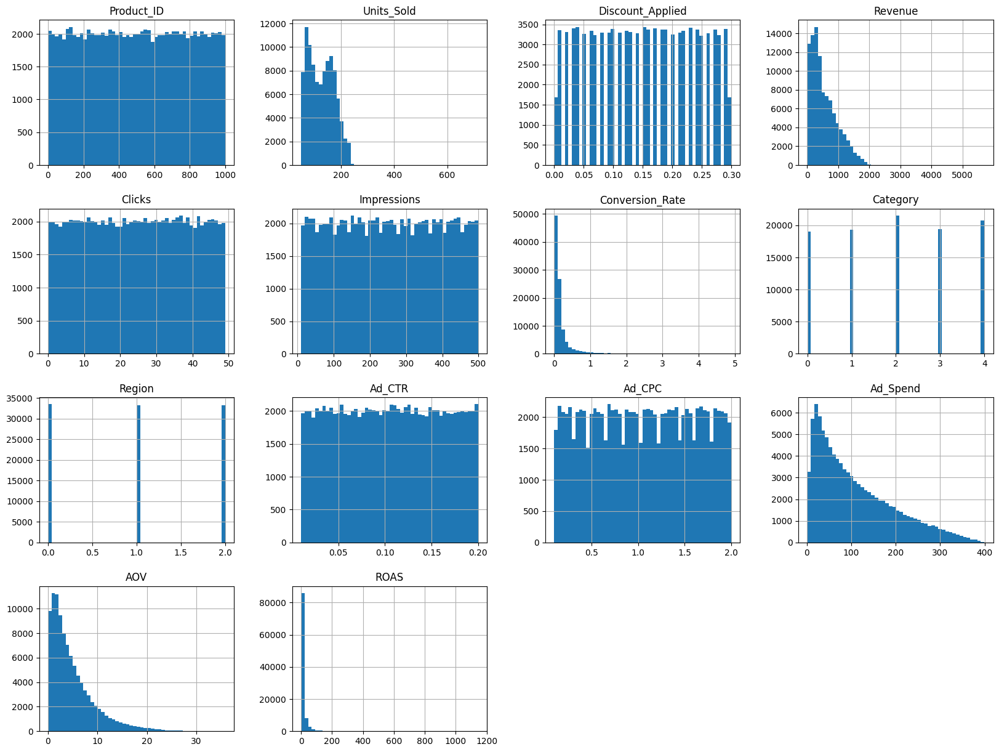

<Figure size 640x480 with 0 Axes>

In [14]:
# Visualize data distributions of each feature using histograms
df.hist(bins=50, figsize=(20, 15))
plt.title('Ecommerce Sales Data Distribution')
plt.show()
plt.savefig('Ecommerce Sales Data Distribution.png')


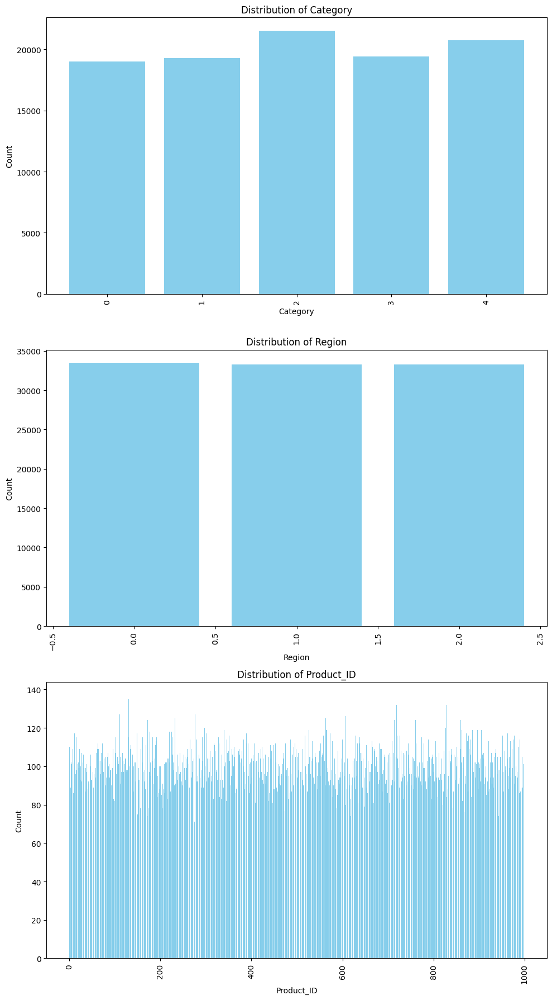

In [15]:
# Creating a Bar Chart of the relatively independent variables,


# Select the relatively independent variables
independent_variables = ['Category', 'Region', 'Product_ID']

# Create a figure with multiple subplots
fig, axs = plt.subplots(len(independent_variables), figsize=(10,6*len(independent_variables)))

# Create a bar chart for each independent variable
for i, variable in enumerate(independent_variables):
    counts = df[variable].value_counts()
    axs[i].bar(counts.index, counts.values, color='skyblue')
    axs[i].set_title(f'Distribution of {variable}')
    axs[i].set_xlabel(variable)
    axs[i].set_ylabel('Count')
    axs[i].tick_params(axis='x', rotation=90)

# Layout so plots do not overlap
fig.tight_layout()

plt.show()

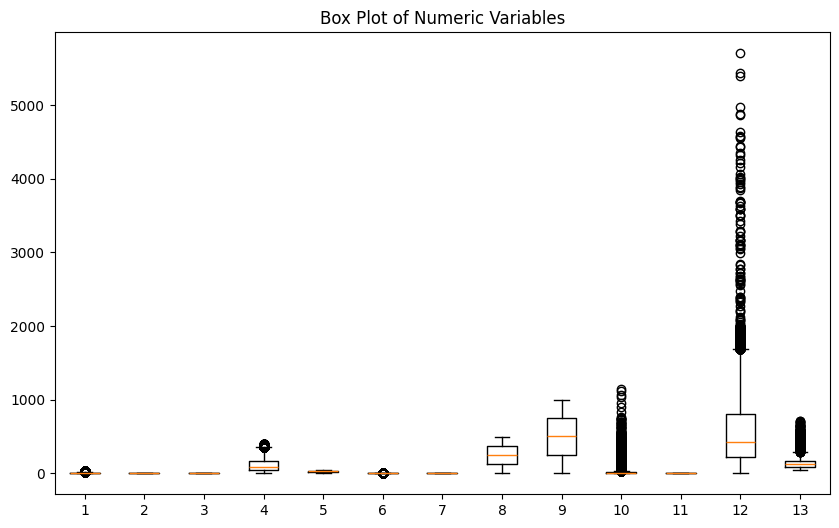

In [16]:
# Visualize outliers using boxplots using Matplotlib
plt.figure(figsize=(10, 6))
plt.boxplot(df[['AOV', 'Ad_CPC', 'Ad_CTR', 'Ad_Spend', 'Clicks', 'Conversion_Rate', 
                'Discount_Applied', 'Impressions', 'Product_ID', 'ROAS', 'Region',
                'Revenue', 'Units_Sold']].values)
plt.title('Box Plot of Numeric Variables')
plt.savefig('Box Plot of Numeric Variables.png')


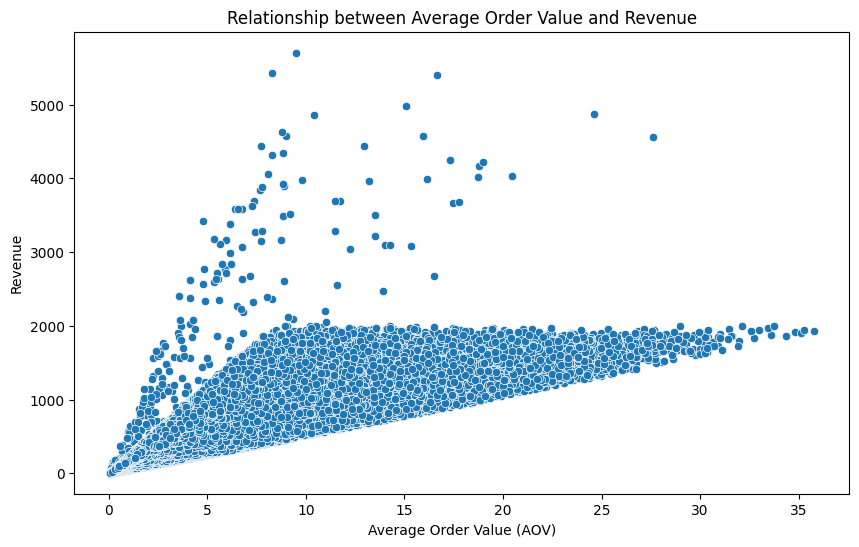

In [17]:
# Creating a Scatter Plot to visualise the relationship between Average Order Value (AOV) and Revenue, using Seaborn

plt.figure(figsize=(10,6))
sns.scatterplot(x='AOV', y='Revenue', data=df)
plt.title('Relationship between Average Order Value and Revenue')
plt.xlabel('Average Order Value (AOV)')
plt.ylabel('Revenue')
plt.show()


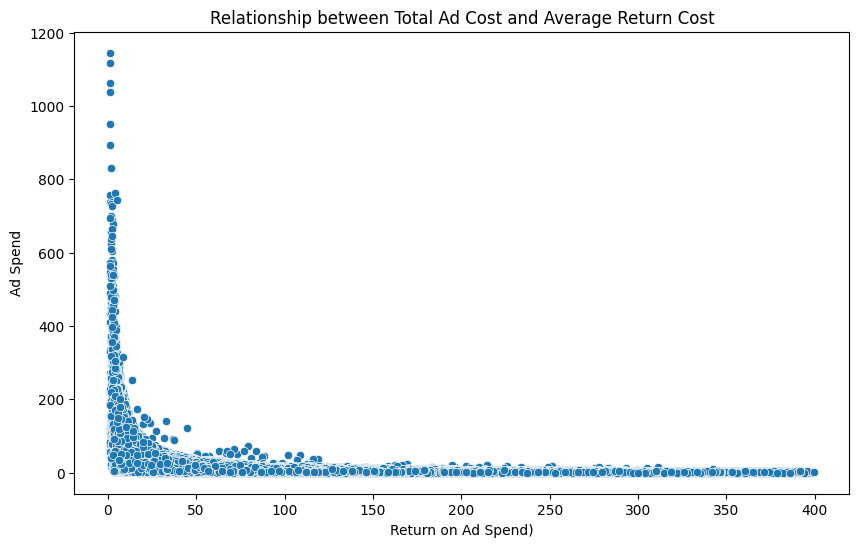

In [18]:
# Creating a Scatter Plot to visualise the relationship between Ad Spend and Return on Ad Spend, using Seaborn

plt.figure(figsize=(10,6))
sns.scatterplot(x='Ad_Spend', y='ROAS', data=df)
plt.title('Relationship between Total Ad Cost and Average Return Cost')
plt.xlabel('Return on Ad Spend)')
plt.ylabel('Ad Spend')
plt.show()

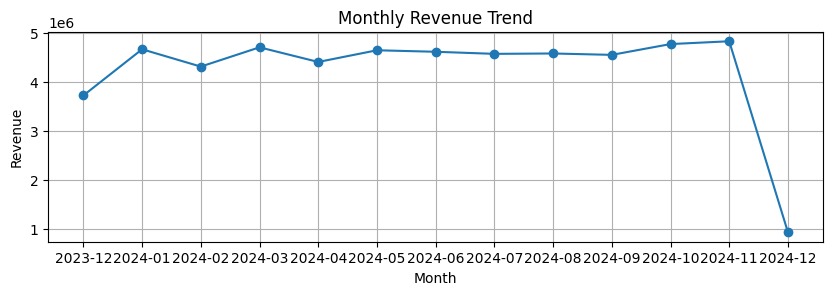

In [19]:
# Creating line charts to visualize the monthly revenue trend and ad spend over time:

# Convert Transaction_Date to datetime format
df['Transaction_Date'] = pd.to_datetime(df['Transaction_Date'], format='%Y-%m-%d')

# Extract month and year from Transaction_Date
df['Month'] = df['Transaction_Date'].dt.strftime('%Y-%m')

# Group by Month and calculate total Revenue and Ad_Spend
monthly_revenue = df.groupby('Month')['Revenue'].sum().reset_index()
monthly_ad_spend = df.groupby('Month')['Ad_Spend'].sum().reset_index()

# Create line charts
plt.figure(figsize=(10, 6))

plt.subplot(2, 1, 1)
plt.plot(monthly_revenue['Month'], monthly_revenue['Revenue'], marker='o')
plt.title('Monthly Revenue Trend')
plt.xlabel('Month')
plt.ylabel('Revenue')
plt.grid(True)

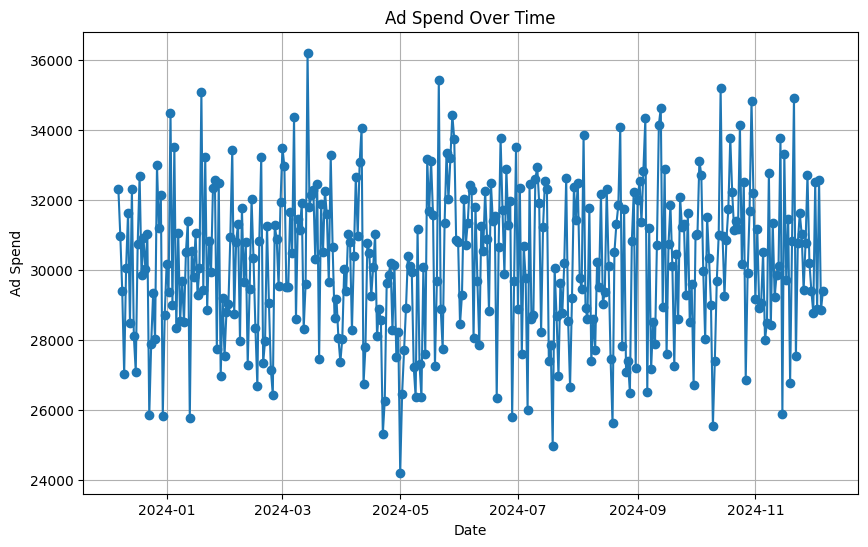

In [20]:
# Creating a line chart for Ad Spend Over Time to examine the ad spend trend over time.

# Group by Transaction_Date and calculate total Ad_Spend
ad_spend_over_time = df.groupby('Transaction_Date')['Ad_Spend'].sum().reset_index()

# Create line chart
plt.figure(figsize=(10,6))
plt.plot(ad_spend_over_time['Transaction_Date'], ad_spend_over_time['Ad_Spend'], marker='o')
plt.title('Ad Spend Over Time')
plt.xlabel('Date')
plt.ylabel('Ad Spend')
plt.grid(True)
plt.show()


Model Selection:

In [21]:
# Splitting our data into features and target:
from sklearn.model_selection import train_test_split

# Define features (X) and target (y)
X = df[['AOV', 'Ad_CPC', 'Ad_CTR', 'Ad_Spend', 'Clicks', 'Conversion_Rate', 
                'Discount_Applied', 'Impressions', 'Product_ID', 'Category', 'Region',
                'Revenue', 'Units_Sold']]
y = df['ROAS']


# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [22]:
# Importing necessary libraries
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score


In [23]:
# Model 1: Linear Regression Model - A supervised learning algorithm that handles linear relationships and it is easy to interpret.
# Create and train linear regression model

# Create and train linear regression model
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

# Make predictions and evaluate model
LR_pred = lr_model.predict(X_test)
print(LR_pred)

[-7.25233545 49.76264392  7.64475323 ... 12.21840815 10.72524683
 35.90011533]


In [24]:
# Model 2: Decision Tree Model - A supervised learning algorithm that handles non-linear relationships and it is easy to interpret.
# Create and train linear regression model
DT_model = DecisionTreeRegressor()
DT_model.fit(X_train, y_train)

# Make predictions and evaluate model
DT_pred = DT_model.predict(X_test)
print(DT_pred)

[ 3.30594007 49.52932331  4.00431796 ...  4.95843621  4.54830656
 24.46520648]


In [25]:
# Model 3: Random Forest Regressor - An ensemble learning algorithm that handles complex patterns, non-linear relationships, and feature interactions

# Create and train Random Forest Regressor model
RF_model = RandomForestRegressor()
RF_model.fit(X_train, y_train)

# Make predictions and evaluate model
RF_pred = RF_model.predict(X_test)
print(RF_pred)

[ 3.25364761 48.81018285  3.99227817 ...  4.97096564  4.67851268
 24.35370471]


In [26]:
# Model 4: Gradient Boosting Regressor - An An ensemble learning algorithm that handles complex patterns, non-linear relationships, and feature interactions.

# Create and train Gradient Boosting Regressor model
GB_model = GradientBoostingRegressor()
GB_model.fit(X_train, y_train)

# Make predictions and evaluate model
GB_pred = GB_model.predict(X_test)
print(GB_pred)

[ 2.97020509 49.35799673  4.23289977 ...  5.26741793  4.22593916
 22.67179108]


Model Evaluation:

### (i) Performance metrics for each of the models

In [27]:
# Using key metrics to evaluate the suitability of the Linear Regression model,

mse = mean_squared_error(y_test, LR_pred)
rmse = mse ** 0.5
mae = mean_absolute_error(y_test, LR_pred)
r2 = r2_score(y_test, LR_pred)
mape = np.mean(np.abs((y_test - LR_pred) / y_test)) * 100

print("Linear Regression Performance Metrics:")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"R2: {r2:.2f}")
print(f"MAPE: {mape:.2f}%")


Linear Regression Performance Metrics:
MSE: 643.57
RMSE: 25.37
MAE: 11.98
R2: 0.38
MAPE: 512.64%


In [28]:
# Using key metrics to evaluate the suitability of the Decision Tree Regressor,

mse = mean_squared_error(y_test, DT_pred)
rmse = mse ** 0.5
mae = mean_absolute_error(y_test, DT_pred)
r2 = r2_score(y_test, DT_pred)
mape = np.mean(np.abs((y_test - DT_pred) / y_test)) * 100

print("Decision Tree Performance Metrics:")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"R2: {r2:.2f}")
print(f"MAPE: {mape:.2f}%")

Decision Tree Performance Metrics:
MSE: 11.44
RMSE: 3.38
MAE: 0.42
R2: 0.99
MAPE: 1.74%


In [29]:
# Using key metrics to evaluate the suitability of the Random Forest Regression model,

mse = mean_squared_error(y_test, RF_pred)
rmse = mse ** 0.5
mae = mean_absolute_error(y_test, RF_pred)
r2 = r2_score(y_test, RF_pred)
mape = np.mean(np.abs((y_test - RF_pred) / y_test)) * 100

print("Random Forest Regressor Performance Metrics:")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"R2: {r2:.2f}")
print(f"MAPE: {mape:.2f}%")

Random Forest Regressor Performance Metrics:
MSE: 5.43
RMSE: 2.33
MAE: 0.17
R2: 0.99
MAPE: 0.56%


In [30]:
# Using key metrics to evaluate the suitability of the Gradient Boosting Regression model,

mse = mean_squared_error(y_test, GB_pred)
rmse = mse ** 0.5
mae = mean_absolute_error(y_test, GB_pred)
r2 = r2_score(y_test, GB_pred)
mape = np.mean(np.abs((y_test - GB_pred) / y_test)) * 100

print("Gradient Boosting Regressor Performance Metrics:")
print(f"MSE: {mse:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAE: {mae:.2f}")
print(f"R2: {r2:.2f}")
print(f"MAPE: {mape:.2f}%")

Gradient Boosting Regressor Performance Metrics:
MSE: 5.53
RMSE: 2.35
MAE: 1.14
R2: 0.99
MAPE: 68.11%


### (ii) Cross Validations for each model

In [31]:
from sklearn.model_selection import cross_val_score

# Cross-Validation for Linear Regression Model
lr_mse_scores = cross_val_score(lr_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
lr_mae_scores = cross_val_score(lr_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
lr_r2_scores = cross_val_score(lr_model, X_train, y_train, cv=5, scoring='r2')
print("Linear Regression Cross-Validation Scores:")
print(f"MSE: {-lr_mse_scores.mean():.2f}")
print(f"MAE: {-lr_mae_scores.mean():.2f}")
print(f"R2: {lr_r2_scores.mean():.2f}")

# Cross-Validation for Decision Trees Model
dt_mse_scores = cross_val_score(DT_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
dt_mae_scores = cross_val_score(DT_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
dt_r2_scores = cross_val_score(DT_model, X_train, y_train, cv=5, scoring='r2')
print("\nDecision Trees Cross-Validation Scores:")
print(f"MSE: {-dt_mse_scores.mean():.2f}")
print(f"MAE: {-dt_mae_scores.mean():.2f}")
print(f"R2: {dt_r2_scores.mean():.2f}")

# Cross-Validation for Random Forest Model
rf_mse_scores = cross_val_score(RF_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
rf_mae_scores = cross_val_score(RF_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
rf_r2_scores = cross_val_score(RF_model, X_train, y_train, cv=5, scoring='r2')
print("\nRandom Forest Cross-Validation Scores:")
print(f"MSE: {-rf_mse_scores.mean():.2f}")
print(f"MAE: {-rf_mae_scores.mean():.2f}")
print(f"R2: {rf_r2_scores.mean():.2f}")

# Cross-Validation for Gradient Boosting Model
gb_mse_scores = cross_val_score(GB_model, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
gb_mae_scores = cross_val_score(GB_model, X_train, y_train, cv=5, scoring='neg_mean_absolute_error')
gb_r2_scores = cross_val_score(GB_model, X_train, y_train, cv=5, scoring='r2')
print("\nGradient Boosting Cross-Validation Scores:")
print(f"MSE: {-gb_mse_scores.mean():.2f}")
print(f"MAE: {-gb_mae_scores.mean():.2f}")
print(f"R2: {gb_r2_scores.mean():.2f}")

Linear Regression Cross-Validation Scores:
MSE: 606.09
MAE: 11.96
R2: 0.39

Decision Trees Cross-Validation Scores:
MSE: 24.64
MAE: 0.48
R2: 0.98

Random Forest Cross-Validation Scores:
MSE: 9.31
MAE: 0.19
R2: 0.99

Gradient Boosting Cross-Validation Scores:
MSE: 5.55
MAE: 0.98
R2: 0.99
